# Setup

In [2]:
import torch
from torch_geometric.data import HeteroData
import torch_geometric.transforms as T
import pandas as pd
import numpy as np
import random
import os
import copy

import sys
sys.path.append("../..")
from src.models.base_model import base_model
import src.models.training_utils as util

random.seed(0)
torch.manual_seed(0)

# Load data

In [3]:
def load_data(folder_path,load_test = False,load_full=False):
    if load_test:
        names = ["train","validation","test"]
    else:
        names = ["train","validation"]
    datasets = []
    for name in names:
        path = folder_path+name+".pt"
        datasets.append(torch.load(path))
    
    return datasets

def initialize_features(data,feature,dim,inplace=False):
    if inplace:
        data_object = data
    else:
        data_object = copy.copy(data)
    for nodetype, store in data_object.node_items():
        if feature == "random":
            data_object[nodetype].x = torch.rand(store["num_nodes"],dim)
        if feature == "ones":
            data_object[nodetype].x = torch.ones(store["num_nodes"],dim)
    return data_object

def load_node_csv(path, index_col,type_col, **kwargs):
    """Returns node dataframe and a dict of mappings for each node type. 
    Each mapping maps from original df index to "heterodata index" { node_type : { dataframe_index : heterodata_index}}"""
    df = pd.read_csv(path, **kwargs,index_col=index_col)
    node_types = df[type_col].unique()
    mappings_dict = dict()
    for node_type in node_types:
        mapping = {index: i for i, index in enumerate(df[df[type_col] == node_type].index.unique())}
        mappings_dict[node_type] = mapping

    return df,mappings_dict

In [4]:
data_folder = "../../data/processed/graph_data_nohubs/merged_types/"
experiments_folder = "../../data/experiments/merged_types_experiment/"

if not os.path.exists(experiments_folder):
    print("experiments_folder dir does not exist, a new directory will be created")
    os.makedirs(experiments_folder)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

train_data, val_data = load_data(data_folder+"split_dataset/")
full_data = torch.load(data_folder+"split_dataset/full_dataset.pt")

# Train model

In [5]:
train_params = {
    'weight_decay': 0.001,
    'lr': 0.001,
    'epochs':400,
    "patience":5,
    "delta":0.01,
}

model_params = {"hidden_channels":32,
                "conv_type":"SAGEConv",
                "batch_norm":True,
                "dropout":0.1,
                "micro_aggregation":"sum",
                "macro_aggregation":"sum",
                "layer_connectivity":None,
                "L2_norm":True,
                "pre_process_layers":0,
                "msg_passing_layers":2,
                "post_process_layers":1,
                "normalize_output":True,
                "jumping_knowledge":False
}

feature_dim = 10
feature_type = 'ones'

train_data = initialize_features(train_data,feature_type,feature_dim)
val_data = initialize_features(val_data,feature_type,feature_dim)
full_data = initialize_features(full_data,feature_type,feature_dim)

In [15]:
from torch_geometric.nn import SAGEConv, to_hetero

class encoder(torch.nn.Module):
    def __init__(self):
        super().__init__()

        self.conv1 = SAGEConv(-1,32,aggr="sum")
        self.bn1 = torch.nn.BatchNorm1d(32)
        self.dropout1 = torch.nn.Dropout(0.1)
        self.conv1_act = torch.nn.LeakyReLU()

        self.conv2 = SAGEConv(32,32,aggr="sum")
        self.bn2 = torch.nn.BatchNorm1d(32)
        self.dropout2 = torch.nn.Dropout(0.1)
        self.conv2_act = torch.nn.LeakyReLU()

        self.post_linear = torch.nn.Linear(32,16)
    
    def forward(self,x:dict,edge_index:dict) -> dict:
        x = self.conv1(x,edge_index)
        x = self.bn1(x)
        x = self.dropout1(x)
        x = self.conv1_act(x)
        x = torch.nn.functional.normalize(x,2,-1)

        x = self.conv2(x,edge_index)
        x = self.bn2(x)
        x = self.dropout2(x)
        x = self.conv2_act(x)
        x = torch.nn.functional.normalize(x,2,-1)

        x = self.post_linear(x)

        return x

class inner_product_decoder(torch.nn.Module):
    def forward(self,x:dict,edge_label_index:dict,supervision_types,apply_sigmoid=True) -> dict:
        pred_dict = {}
        for edge_type in supervision_types:
            edge_index = edge_label_index[edge_type]

            source_type, _ , target_type = edge_type
            
            x_source = x[source_type]
            x_target = x[target_type]

            source_index, target_index = edge_index[0], edge_index[1]

            nodes_source = x_source[source_index]
            nodes_target = x_target[target_index]

            pred = (nodes_source * nodes_target).sum(dim=1)

            if apply_sigmoid:
                pred = torch.sigmoid(pred)

            pred_dict[edge_type] = pred
        
        return pred_dict

class Model(torch.nn.Module):
    def __init__(self,metadata,supervision_types):
        super().__init__()
          
        self.encoder = to_hetero(encoder(),metadata,aggr="sum")
        self.decoder = inner_product_decoder()
        self.loss_fn = torch.nn.BCELoss()
        self.supervision_types = supervision_types
    
    
    def forward(self,x:dict,edge_index:dict,edge_label_index:dict,return_tensor=None) -> dict:
        x = self.encoder(x,edge_index)
        pred = self.decoder(x,edge_label_index,self.supervision_types)

        if return_tensor is not None:
            pred = pred[self.supervision_types[return_tensor]]

        return pred
    
    def loss(self, prediction_dict, label_dict):
        loss = 0
        for edge_type,pred in prediction_dict.items():
            y = label_dict[edge_type]
            loss += self.loss_fn(pred, y.type(pred.dtype))
        return loss

In [6]:
model = base_model(model_params,train_data.metadata(),[("gene_protein","gda","disease"),("disease","disease_disease","disease")])

1.4345839023590088
1.1405692100524902
1.0015244483947754
0.9528653025627136
0.9234879016876221
0.9009582996368408
0.8829617500305176
0.8656082153320312


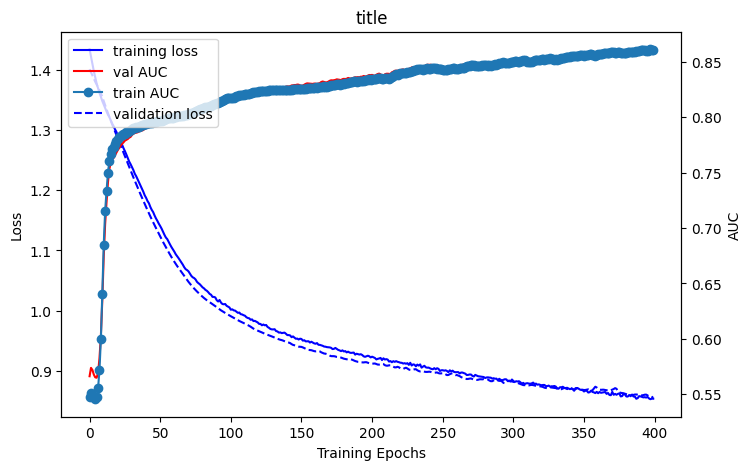

In [17]:
trained_model, auc = util.launch_experiment(model,train_data,val_data,train_params)

In [18]:
util.full_test(model,val_data,200,False)

{('gene_protein', 'gda', 'disease'): [0.9, 0.87, 0.9, 199.0],
 ('disease', 'disease_disease', 'disease'): [0.65, 0.59, 0.65, 185.0]}

# Visualize embeddings

In [10]:
node_data, node_map = load_node_csv(data_folder+"merged_nodes.csv","node_index","node_type")
node_names = node_data[(node_data.node_type == "disease") | (node_data.node_type == "gene_protein")].sort_values(by="node_type").node_name.values
node_info =  pd.read_csv(data_folder+"nohub_graph_node_data.csv")

In [11]:
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

@torch.no_grad()
def get_encodings(model,data):
    model.eval()
    encodings = model.encoder(data.x_dict, data.edge_index_dict)
    return encodings

def plot_pca(gene_encodings,disease_encodings,title,n_components,plot_components):

    z1 = disease_encodings.detach().cpu().numpy()
    z2 = gene_encodings.detach().cpu().numpy()

    z = np.concatenate([z1,z2])

    num_diseases = z1.shape[0]
    num_genes = z2.shape[0]

    pca = PCA(n_components=n_components)
    components = pca.fit_transform(z)
    fig = px.scatter(components, x=plot_components[0], y=plot_components[1], color=['b']*num_diseases + ['r']*num_genes, title=title,hover_name=node_names,width=800, height=400)

    fig.show()

def plot_pca_with_communities(gene_encodings,disease_encodings,title,n_components,plot_components,node_info,partition="comunidades_infomap"):

    z1 = disease_encodings.detach().cpu().numpy()
    z2 = gene_encodings.detach().cpu().numpy()

    z = np.concatenate([z1,z2])

    pca = PCA(n_components=n_components)
    components = pca.fit_transform(z)

    node_clusters = node_info[["node_index",partition]].dropna()
    node_map_series = pd.Series(node_map["disease"],name="tensor_index")
    node_clusters = node_clusters.merge(node_map_series,left_on="node_index",right_index=True,how="right").sort_values(by="tensor_index").fillna(-1)

    df = pd.DataFrame(components)
    df["node_names"] = node_names
    df = df.merge(node_clusters[["tensor_index",partition]],left_index=True,right_on="tensor_index",how="left").reset_index(drop=True).fillna(-2)
    df[partition] = df[partition].astype(str)
    
    fig = px.scatter(df, x=plot_components[0], y=plot_components[1], color=partition, title=title,hover_name="node_names",width=800, height=400)
    fig.show()

def plot_pca_all_types(encodings_dict,title,n_components,plot_components):

    encodings = [tensor.detach().cpu().numpy() for tensor in encodings_dict.values()]
    z = np.concatenate(encodings)

    pca = PCA(n_components=n_components)
    components = pca.fit_transform(z)
    component_df = pd.DataFrame(components)

    sub_dfs = []
    for node_type in encodings_dict.keys():
        sub_df = node_data[node_data.node_type == node_type]
        node_map_series = pd.Series(node_map[node_type],name="tensor_index")
        sub_df = sub_df.merge(node_map_series,left_on="node_index",right_index=True,how="right").sort_values(by="tensor_index").reset_index(drop=True)

        sub_dfs.append(sub_df)

    df = pd.concat(sub_dfs,ignore_index=True)
    df = df.merge(component_df,left_index=True,right_index=True)

    fig = px.scatter(df, x=plot_components[0], y=plot_components[1], color="node_type", title=title,hover_name="node_name",width=800, height=400)

    fig.show()

def plot_tsne(encodings_dict,n_components,plot_components,title,colors):
    node_info = pd.read_csv(data_folder+"nohub_graph_node_data.csv")
    encodings = [tensor.detach().cpu().numpy() for tensor in encodings_dict.values()]
    z = np.concatenate(encodings)
    tsne = TSNE(n_components=n_components, random_state=0)
    proj = tsne.fit_transform(z)
    proj_df = pd.DataFrame(proj)

    sub_dfs = []
    for node_type in encodings_dict.keys():
        sub_df = node_info[node_info.node_type == node_type]
        node_map_series = pd.Series(node_map[node_type],name="tensor_index")
        sub_df = sub_df.merge(node_map_series,left_on="node_index",right_index=True,how="right").sort_values(by="tensor_index").reset_index(drop=True)

        sub_dfs.append(sub_df)

    df = pd.concat(sub_dfs,ignore_index=True)
    df = df.merge(proj_df,left_index=True,right_index=True).fillna(-1).astype({"comunidades_infomap":str,"comunidades_louvain":str})

    fig = px.scatter(df, x=plot_components[0], y=plot_components[1], color=colors, title=title,hover_name="node_name",width=800, height=400)

    fig.show()

In [19]:
encodings = get_encodings(model,train_data)
gene_encodings = encodings["gene_protein"]
disease_encodings = encodings["disease"]

plot_pca_with_communities(gene_encodings,disease_encodings,"PCA",2,[0,1],node_info,"comunidades_louvain")

In [13]:
plot_pca_all_types(encodings,"PCA",2,[0,1])

In [14]:
plot_tsne(encodings,2,[0,1],"aver","comunidades_louvain")

/home/ingrid/Documents/tesis/gcnn_gdas/venv/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/home/ingrid/Documents/tesis/gcnn_gdas/venv/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

